In [2]:
# library(SingleCellExperiment)
# library(scran)
# library(scater)

In [3]:
filename = "/hps/nobackup/stegle/users/acuomo/all_scripts/covid/atlas_E8.5.Rds"

In [4]:
sce_all = readRDS(filename)
sce = sce_all

In [5]:
sce

class: SingleCellExperiment 
dim: 29452 20978 
metadata(1): log.exprs.offset
assays(2): counts logcounts
rownames(29452): ENSMUSG00000051951 ENSMUSG00000089699 ...
  ENSMUSG00000096730 ENSMUSG00000095742
rowData names(3): ID Symbol SymbolUniq
colnames(20978): AAACATACCACTGA-17 AAACATTGCAACTG-17 ...
  TTTCTACTTCTCTA-37 TTTGCATGCTGATG-37
colData names(30): Sample Barcode ... endo_gutDPT endo_gutCluster
reducedDimNames(0):
spikeNames(0):
altExpNames(0):

In [426]:
# make sure to remove pre-existing size factors, previously computed log counts
assay(sce, "logcounts") <- NULL
sizeFactors(sce) <- NULL

In [427]:
##### Note this step is hard-coded
# partial and full datasets might not and often will not be subsamples of a single sce object

In [428]:
table(sce$sample)


  17   29   36   37 
4483 7569 4915 4011 

In [429]:
### select samples
# sample1 = '17'
# sample1 = '29'
# sample1 = '36'
sample1 = '37'
##
# sample2 = '17'
# sample2 = '29'
sample2 = '36'
# sample2 = '37'

In [430]:
# will act as full dataset
sce1 = sce[,sce$sample == sample1]
# will act as partial (incomplete) dataset
sce2 = sce[,sce$sample == sample2]

In [431]:
sce_all = sce
sce_all1 = sce1
sce_all2 = sce2

In [432]:
celltypes1 = as.character(unique(sce1$celltype))
celltypes2 = as.character(unique(sce2$celltype))

In [433]:
celltypes = celltypes1[celltypes1 %in% celltypes2]
celltypes = celltypes[!(is.na(celltypes))]
celltypes

[1] "Erythroid3"                     "ExE endoderm"                  
 [3] "Surface ectoderm"               "Neural crest"                  
 [5] "Paraxial mesoderm"              "Allantois"                     
 [7] "Somitic mesoderm"               "Haematoendothelial progenitors"
 [9] "Forebrain/Midbrain/Hindbrain"   "Mesenchyme"                    
[11] "Endothelium"                    "Intermediate mesoderm"         
[13] "Blood progenitors 1"            "Cardiomyocytes"                
[15] "ExE mesoderm"                   "Pharyngeal mesoderm"           
[17] "NMP"                            "Erythroid2"                    
[19] "Gut"                            "Spinal cord"                   
[21] "Def. endoderm"                  "Erythroid1"                    
[23] "Caudal Mesoderm"                "Visceral endoderm"             
[25] "Blood progenitors 2"            "Rostral neurectoderm"          
[27] "PGC"

In [434]:
select_genes <- function(dec,n){
    dec = dec[order(dec$mean),]
    m = min(dec$mean)
    M = max(dec$mean)
    genes = c()
    for (i in seq(m,M,length.out=n)){
        genes = c(genes,names(head(dec$mean[dec$mean>i],1)))
    }
    genes
}

In [6]:
mydir = "/hps/nobackup/stegle/users/acuomo/all_scripts/covid/variance_dfs/"
gastr_dir = paste0(mydir,"gastrulation_folder/")

In [436]:
for (celltype in celltypes){
    print(celltype)
    sce1 = sce_all1[,!(is.na(sce_all1$celltype)) &  sce_all1$celltype == celltype]
    sce2 = sce_all2[,!(is.na(sce_all2$celltype)) &  sce_all2$celltype == celltype]
    if (ncol(sce1) ==1 | ncol(sce2) ==1){break}
    ## sce1
    sce = sce1
    # use edgeR to compute (log2) CPM
    logcounts(sce) = edgeR::cpm(counts(sce), log = TRUE, prior.count = 0.1)
    # compute mean variance trend (for sce1)
    dec1 <- scran::modelGeneVar(sce)
    sce1 = sce
    ## sce1
    sce = sce2
    # use edgeR to compute (log2) CPM
    logcounts(sce) = edgeR::cpm(counts(sce), log = TRUE, prior.count = 0.1)
    # compute mean variance trend (for sce2, before subsetting to only few genes)
    dec2 <- scran::modelGeneVar(sce)
    # select (10 genes) at intervals along the mean
    selected_genes = select_genes(dec2, n=11)
    ## now actually make sce2 partial
    # after saving total counts
    sce$total_counts = colSums(counts(sce))
    # select down on only present genes
    sce = sce[selected_genes,]
    assay(sce, "logcounts") <- NULL
    # re normalise (using total counts)
    logcounts(sce) = edgeR::cpm(counts(sce), log = TRUE, lib.size = sce$total_counts, prior.count = 0.1)
    sce2 = sce
    # make df to save
    df = data.frame(mean = rowMeans(logcounts(sce2)), 
                sampled_variance = rowVars(logcounts(sce2)),
               est_from_full_variance = metadata(dec1)$trend(rowMeans(logcounts(sce2))),
               est_from_partial_variance_when_present = metadata(dec2)$trend(rowMeans(logcounts(sce2))))
    df$n_cells_sample1 = ncol(sce1)
    df$n_cells_sample2 = ncol(sce2)
    celltype = gsub("/","_",celltype)
    celltype = gsub(" ","_",celltype)
    filename = paste0(gastr_dir,"celltype_",celltype,".full_sample_",sample1,".partial_sample_",sample2,".csv")
#     print(filename)
    write.csv(df, filename)
    
}

[1] "Erythroid3"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "ExE endoderm"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "Surface ectoderm"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "Neural crest"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "Paraxial mesoderm"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "Allantois"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "Somitic mesoderm"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "Haematoendothelial progenitors"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "Forebrain/Midbrain/Hindbrain"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "Mesenchyme"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "Endothelium"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "Intermediate mesoderm"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "Blood progenitors 1"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "Cardiomyocytes"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "ExE mesoderm"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "Pharyngeal mesoderm"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "NMP"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "Erythroid2"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "Gut"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "Spinal cord"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "Def. endoderm"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "Erythroid1"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "Caudal Mesoderm"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "Visceral endoderm"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "Blood progenitors 2"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "Rostral neurectoderm"


In [7]:
myfiles = list.files(gastr_dir)

In [8]:
# myfiles1 = list.files(gastr_dir,".full_sample_17.partial_sample_29.")
# myfiles2 = list.files(gastr_dir,".full_sample_17.partial_sample_36.")
# myfiles3 = list.files(gastr_dir,".full_sample_17.partial_sample_37.")
# myfiles3

In [9]:
make_plotting_df <- function(df){
    df0 = df[,c("mean","sampled_variance")]
    colnames(df0) <- c("mean","variance")
    df0$type = 'sample_variance_sample2'
    df1 = df[,c("mean","est_from_full_variance")]
    colnames(df1) <- c("mean","variance")
    df1$type = 'var_estimated_from_mean_var_trend_from_sample1'
    df2 = df[,c("mean","est_from_partial_variance_when_present")]
    colnames(df2) <- c("mean","variance")
    df2$type = 'var_estimated_from_mean_var_trend_from_sample2'
    rbind(df0,df1,df2)
}

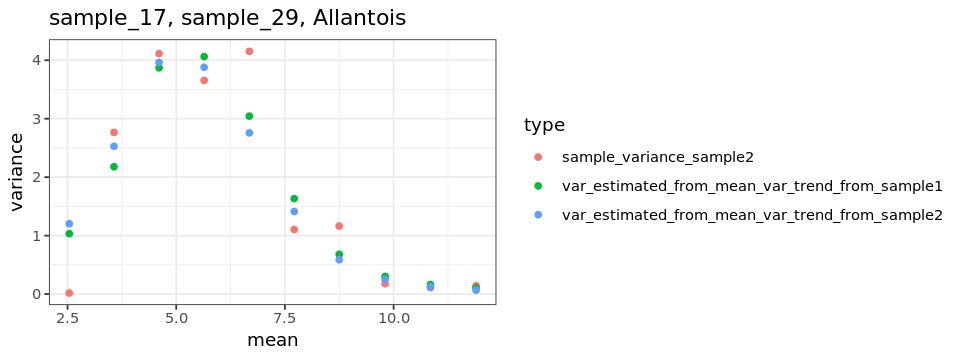

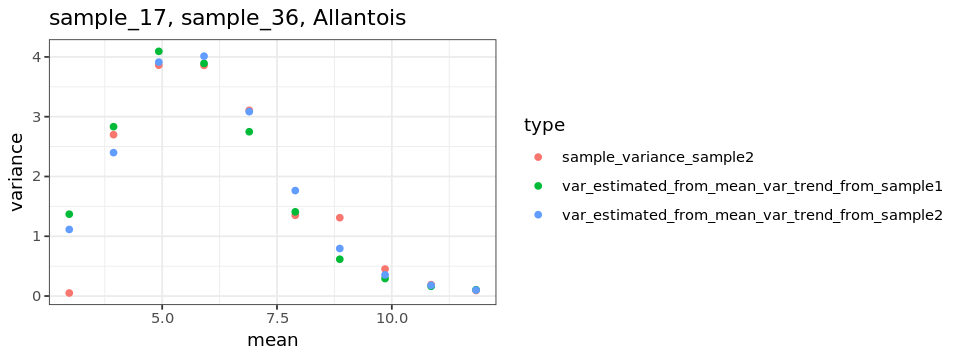

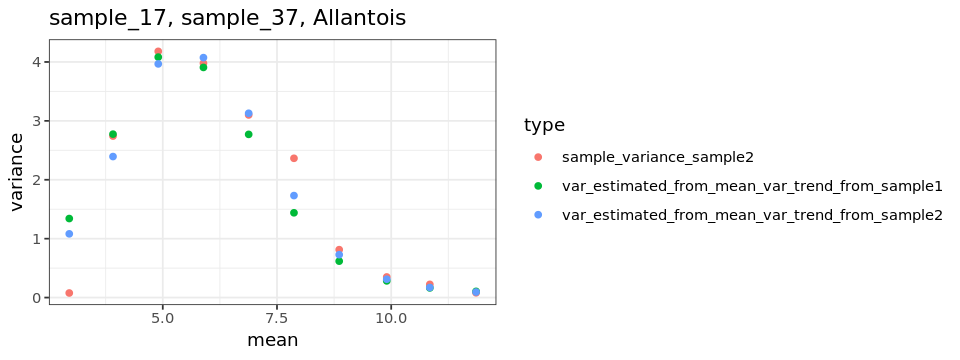

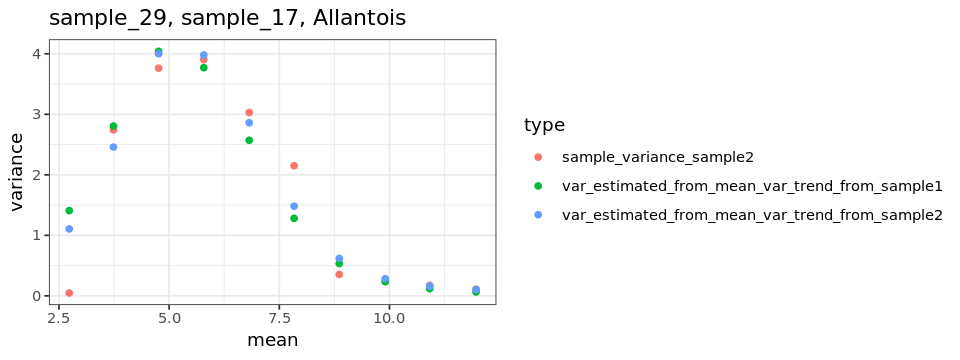

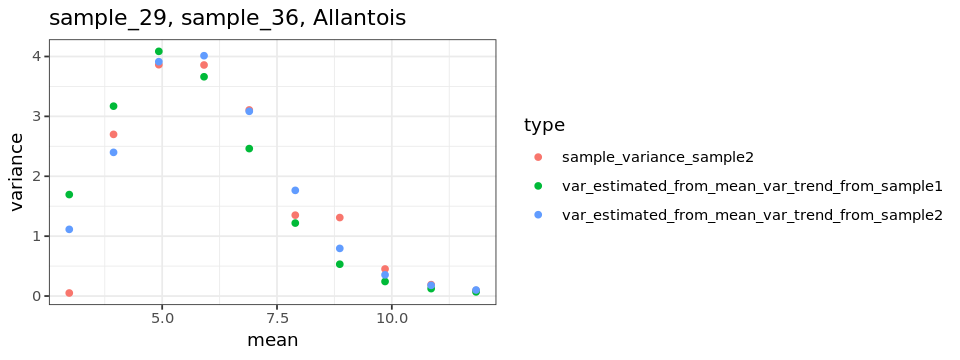

...

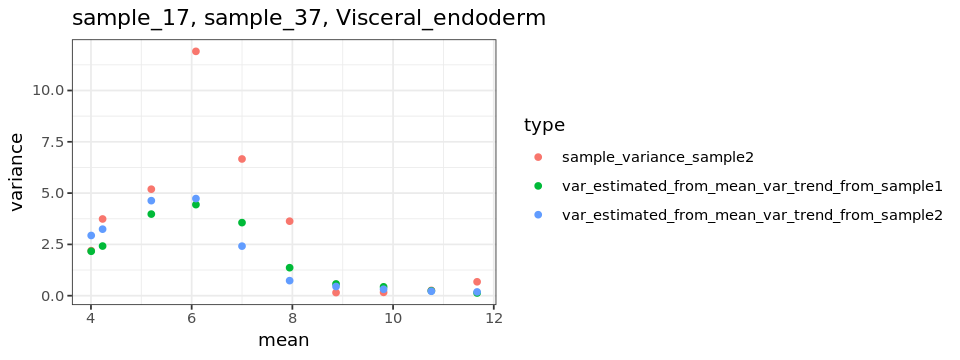

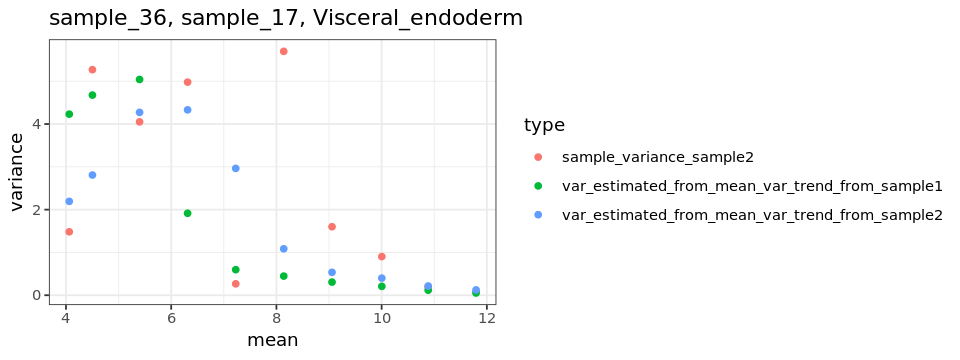

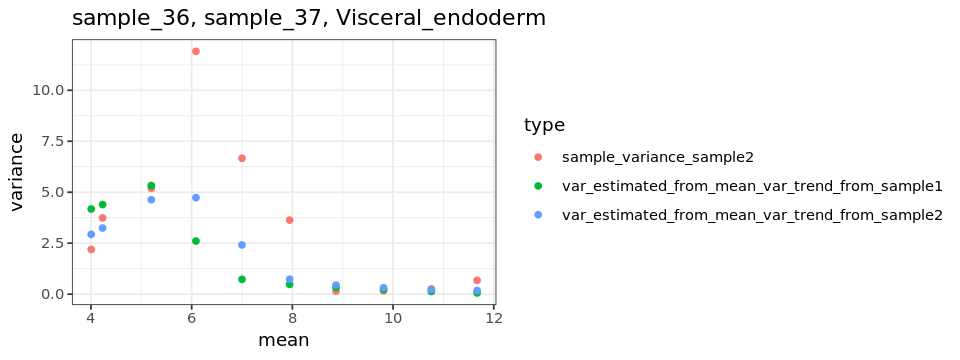

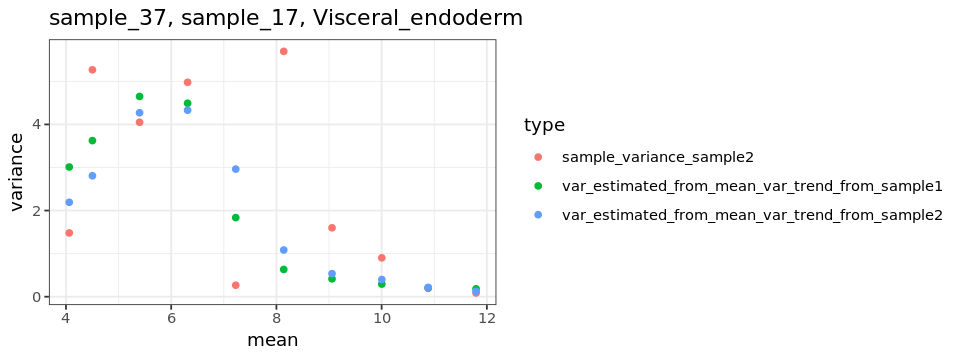

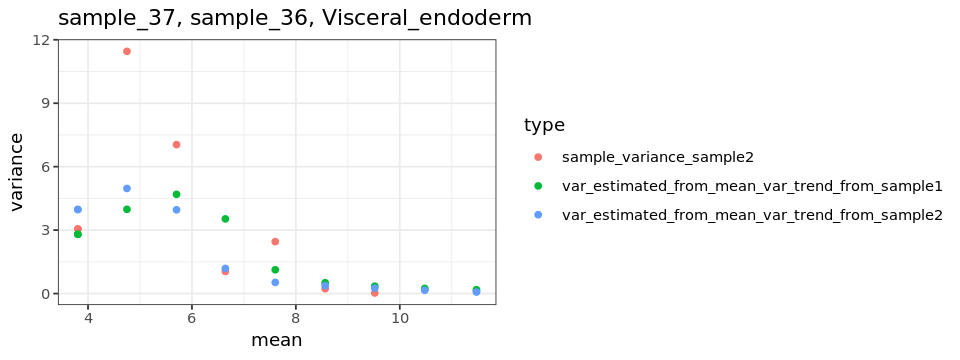

In [10]:
options(repr.plot.width = 8, repr.plot.height = 3)
for (file in myfiles){
    celltype = gsub("\\.full.*","",gsub("celltype_","",file))
    sample1 = gsub(".*\\.full_","",gsub("\\.partial_sample_.*","",file))
    sample2 = gsub(".*\\.partial_","",gsub(".csv","",file))
    filename = paste0(gastr_dir,file)
    df = read.csv(filename, row.names = 1)
    plotting_df = make_plotting_df(df)
    p = ggplot(plotting_df, aes(x = mean, y = variance, col = type)) + geom_point() + theme_bw()
    print(p + ggtitle(paste0(sample1,", ",sample2,", ",celltype)))
}

In [11]:
# options(repr.plot.width = 8, repr.plot.height = 3)
# for (file in myfiles3){
#     celltype = gsub("\\.full.*","",gsub("celltype_","",file))
#     filename = paste0(gastr_dir,file)
#     df = read.csv(filename, row.names = 1)
#     plotting_df = make_plotting_df(df)
#     p = ggplot(plotting_df, aes(x = mean, y = variance, col = type)) + geom_point() + theme_bw()
#     print(p + ggtitle(celltype))
# }

In [12]:
get_distance_from_df <- function(df){
    df$dist = abs(df$sampled_variance-df$est_from_full_variance)
    mean(df$dist)
}

In [13]:
dist_df = data.frame()

In [14]:
for (file in myfiles){
    celltype = gsub("\\.full.*","",gsub("celltype_","",file))
    sample1 = gsub(".*\\.full_","",gsub("\\.partial_sample_.*","",file))
    sample2 = gsub(".*\\.partial_","",gsub(".csv","",file))
    filename = paste0(gastr_dir,file)
    df = read.csv(filename, row.names = 1)
    dist = get_distance_from_df(df)
    dist_df = rbind(dist_df, data.frame(sample1 = sample1, sample2 = sample2, celltype = celltype, 
                                        avg_distance = dist, n_genes = nrow(df), 
                                        ncells_sample1 = df$n_cells_sample1[1], 
                                        ncells_sample2 = df$n_cells_sample2[1]))
}

In [15]:
head(dist_df)

sample1,sample2,celltype,avg_distance,n_genes,ncells_sample1,ncells_sample2
sample_17,sample_29,Allantois,0.4588029,10,101,322
sample_17,sample_36,Allantois,0.3029301,10,101,122
sample_17,sample_37,Allantois,0.3067958,10,101,73
sample_29,sample_17,Allantois,0.3453369,10,322,101
sample_29,sample_36,Allantois,0.4389475,10,322,122
sample_29,sample_37,Allantois,0.4603080,10,322,73


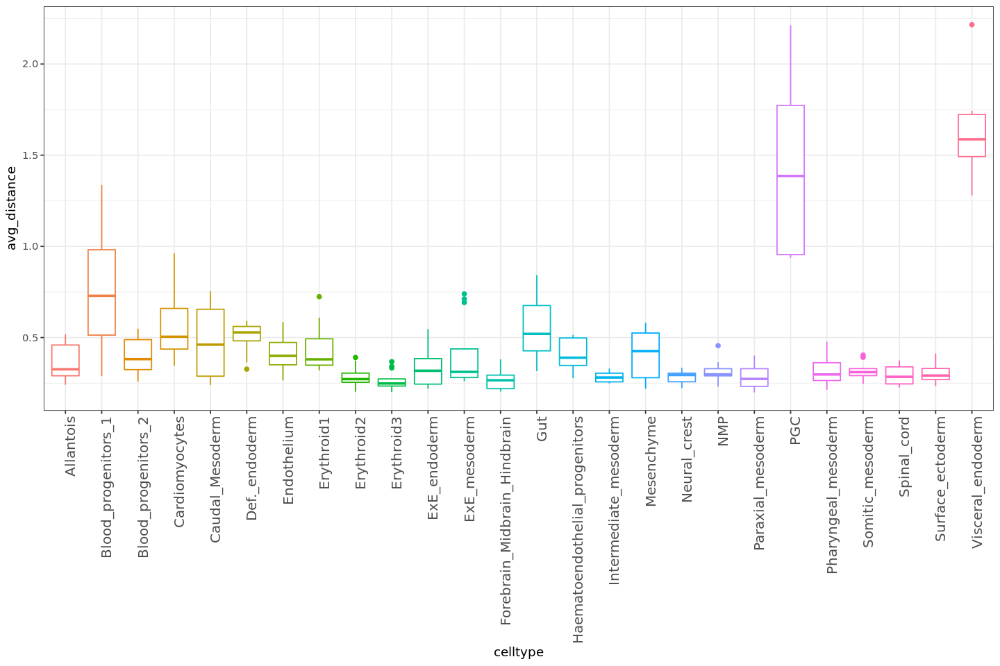

In [16]:
options(repr.plot.width = 12, repr.plot.height = 8)
ggplot(dist_df, aes(x = celltype, y = avg_distance, colour = celltype)) + geom_boxplot() + theme_bw() +
    theme(legend.position = "none", axis.text.x = element_text(angle = 90, hjust = 1, size = 12))

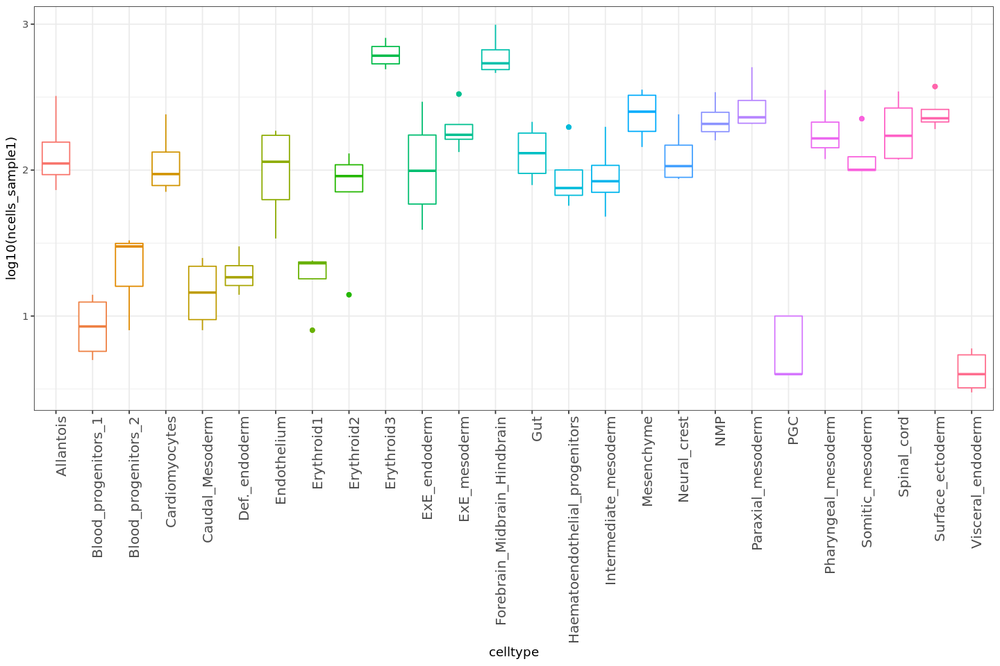

In [17]:
options(repr.plot.width = 12, repr.plot.height = 8)
ggplot(dist_df, aes(x = celltype, y = log10(ncells_sample1), colour = celltype)) + geom_boxplot() + theme_bw() +
    theme(legend.position = "none", axis.text.x = element_text(angle = 90, hjust = 1, size = 12))

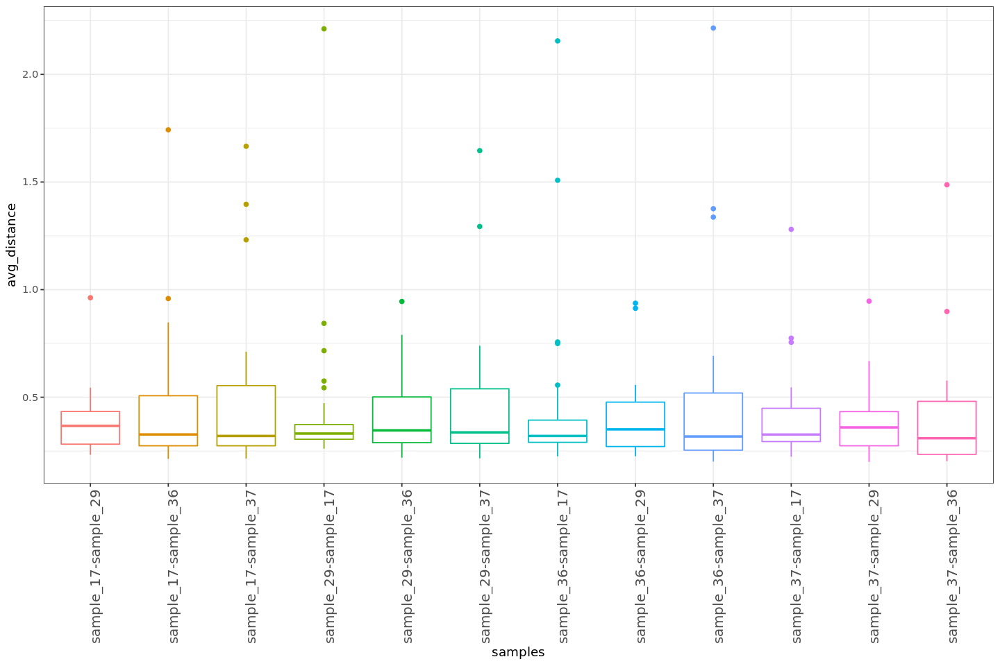

In [447]:
options(repr.plot.width = 12, repr.plot.height = 8)
dist_df$samples = paste0(dist_df$sample1,"-",dist_df$sample2)
ggplot(dist_df, aes(x = samples, y = avg_distance, colour = samples)) + geom_boxplot() + theme_bw() +
    theme(legend.position = "none", axis.text.x = element_text(angle = 90, hjust = 1, size = 12))

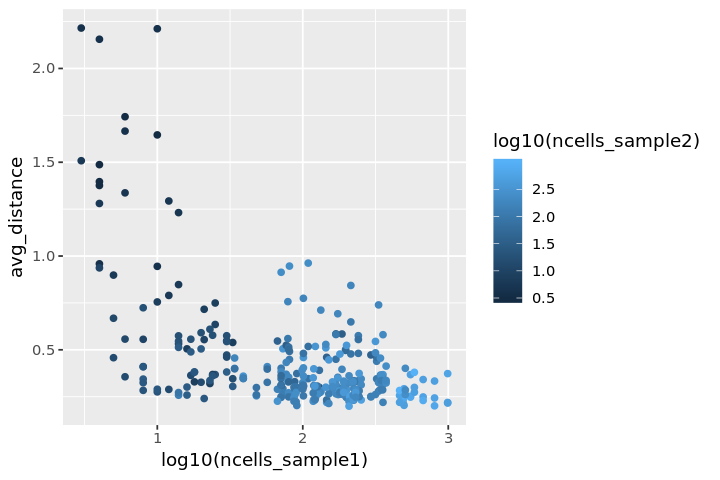

In [18]:
options(repr.plot.width = 6, repr.plot.height = 4)
ggplot(dist_df, aes(x = log10(ncells_sample1), y = avg_distance, colour = log10(ncells_sample2))) + geom_point()